In [1]:
#import libraries
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import sklearn
from datetime import datetime
from math import sqrt
import math

In [2]:
#Data = pd.read_csv("ISO_NE/ISO_Final_data.csv") 
Data = pd.read_csv("SPAIN_data/Final_data_2_new.csv") 
#365*24 = 8760, the year 2018 is used for test set. 
Final_Data = Data[:-8760].copy()
Final_Data = Final_Data.set_index('time')
Data_hour_index = Final_Data.set_index('hour')
Data_hour_index.tail()
#Final_Data = Final_Data.set_index('time')



,total load actual,total load forecast,weekday,month,day_of_year,day_of_month,weekdays_weekends,prev_week_load,2prev_week_load,3prev_week_load,...,humidity_Barcelona_fd_n,wind_speed_Barcelona_fd_n,temp_Valencia_fd_n,pressure_Valencia_fd_n,humidity_Valencia_fd_n,wind_speed_Valencia_fd_n,temp_Bilbao_fd_n,pressure_Bilbao_fd_n,humidity_Bilbao_fd_n,wind_speed_Bilbao_fd_n
hour,,,,,,,,,,,,,,,,,,,,,
19.0,0.709423,29226.0,1.0,1.0,0.997268,1.0,1,0.733732,0.787029,0.621309,...,0.651903,0.050785,0.922688,0.941596,0.428239,0.123945,0.911847,0.942164,0.786088,0.127895
20.0,0.698915,29107.0,1.0,1.0,0.997268,1.0,1,0.713714,0.814434,0.678045,...,0.693567,0.028856,0.912584,0.941942,0.497611,0.129630,0.904848,0.940268,0.893807,0.049372
21.0,0.664635,27453.0,1.0,1.0,0.997268,1.0,1,0.673363,0.820163,0.680873,...,0.678320,0.081440,0.915374,0.942700,0.494734,0.149075,0.907141,0.943265,0.778529,0.071107
22.0,0.610581,25114.0,1.0,1.0,0.997268,1.0,1,0.622894,0.789443,0.646398,...,0.686069,0.035079,0.910274,0.942048,0.534380,0.144508,0.906956,0.940773,0.786837,-0.001174
23.0,0.577350,24084.0,1.0,1.0,0.997268,1.0,1,0.599732,0.727100,0.605096,...,0.672789,0.057133,0.915130,0.943758,0.568733,0.090982,0.908974,0.941168,0.765945,0.070355


# create and plot load for every hour of the day

In [3]:
Final_Data.head()

,total load actual,total load forecast,hour,weekday,month,day_of_year,day_of_month,weekdays_weekends,prev_week_load,2prev_week_load,...,humidity_Barcelona_fd_n,wind_speed_Barcelona_fd_n,temp_Valencia_fd_n,pressure_Valencia_fd_n,humidity_Valencia_fd_n,wind_speed_Valencia_fd_n,temp_Bilbao_fd_n,pressure_Bilbao_fd_n,humidity_Bilbao_fd_n,wind_speed_Bilbao_fd_n
time,,,,,,,,,,,,,,,,,,,,,
2015-01-29 00:00:00+01:00,0.696745,29143.0,0.0,0.5,0.083333,0.076503,0.903226,0,0.725466,0.679386,...,0.577628,0.052925,0.911796,0.907689,0.732581,0.455501,0.890167,0.905896,0.893859,0.162258
2015-01-29 01:00:00+01:00,0.641546,26868.0,1.0,0.5,0.083333,0.079235,0.935484,0,0.661636,0.624576,...,0.546066,0.045364,0.913751,0.908808,0.722255,0.430385,0.886338,0.907886,0.906847,0.096989
2015-01-29 02:00:00+01:00,0.609923,25463.0,2.0,0.5,0.083333,0.079235,0.935484,0,0.625990,0.591710,...,0.546069,0.004723,0.914138,0.910084,0.731997,0.490778,0.884923,0.905660,0.879407,0.133098
2015-01-29 03:00:00+01:00,0.595099,24839.0,3.0,0.5,0.083333,0.079235,0.935484,0,0.612044,0.583689,...,0.562172,0.024477,0.906960,0.909655,0.712570,0.527241,0.883615,0.907367,0.917480,0.134457
2015-01-29 04:00:00+01:00,0.592344,24629.0,4.0,0.5,0.083333,0.079235,0.935484,0,0.608363,0.579349,...,0.565704,0.016230,0.901623,0.907413,0.806337,0.134723,0.885946,0.908256,0.910870,0.122846


In [4]:
#spain dataset
#create a new dataframe, every column represent the load of every 24 hours of the dayhourly_load = []
hourly_load = []
for i in range(0, 24):
    hourly_load.append(Data_hour_index['total load actual'][i].values.tolist())
Data_by_hour = {f"{i} hour": hourly_load[i] for i in range(24)}
# creates Dataframe. 
Data_by_hour = pd.DataFrame(Data_by_hour) 

#iso_ne dataset
#create a new dataframe, every column represent the load of every 24 hours of the dayhourly_load = []
hourly_load = []
for i in range(0, 24):
    hourly_load.append(Data_hour_index['demand'][i+1].values.tolist())
Data_by_hour = {f"{i+1} hour": hourly_load[i] for i in range(24)}
# creates Dataframe. 
Data_by_hour = pd.DataFrame(Data_by_hour) 

In [5]:
Data_by_hour.head()

,0 hour,1 hour,2 hour,3 hour,4 hour,5 hour,6 hour,7 hour,8 hour,9 hour,...,14 hour,15 hour,16 hour,17 hour,18 hour,19 hour,20 hour,21 hour,22 hour,23 hour
0,0.696745,0.641546,0.609923,0.595099,0.592344,0.606364,0.668609,0.783933,0.857101,0.879507,...,0.847251,0.837377,0.835548,0.845910,0.882848,0.927392,0.928685,0.908131,0.843423,0.766744
1,0.703596,0.649421,0.619310,0.602877,0.598952,0.609314,0.666268,0.774058,0.842350,0.868585,...,0.841960,0.826527,0.819432,0.828648,0.861295,0.897111,0.885798,0.863270,0.814848,0.750530
2,0.700329,0.654663,0.610069,0.588565,0.579008,0.578666,0.589614,0.617457,0.655053,0.716713,...,0.750652,0.717689,0.699525,0.699866,0.744971,0.799390,0.812118,0.804194,0.767622,0.720151
3,0.592417,0.533488,0.499695,0.481044,0.475436,0.490382,0.540119,0.602475,0.664830,0.727185,...,0.801910,0.806236,0.810563,0.814889,0.819215,0.823542,0.827868,0.825332,0.788102,0.728173
4,0.650664,0.600000,0.569231,0.556772,0.556699,0.576984,0.654907,0.778739,0.862977,0.895721,...,0.887895,0.877923,0.873802,0.878874,0.904815,0.949482,0.951896,0.925052,0.855882,0.771669


In [7]:
import plotly.express as px 
Data_February= Data_by_hour[2:32]

fig = px.line(Data_February, x= Data_February.index, y=Data_February.columns)
fig.show()

# Additive Decomposition

In [39]:
#a function to remove Nan values from a list
def remove_NaN(a_list):
    return [item for item in a_list if str(item) != 'nan']

In [40]:
#apply decomposition and find trend, season and residual components, # result.trend to take trend
from statsmodels.tsa.seasonal import seasonal_decompose
decompfreq = 24*7
results_add = []
for i in range(0,24):
    results_add.append(seasonal_decompose(x=Data_by_hour[str(i) + ' hour'],freq=decompfreq, model='additive'))
tre_sea_res = []
season_list = []
trend_list = []
resid_list = []
for result in results_add:
    temp_trend = remove_NaN(result.trend)
    temp_resid = remove_NaN(result.resid)
    temp_seaso = list(result.seasonal)
    trend_list.append(temp_trend)
    season_list.append(temp_seaso)
    resid_list.append(temp_resid)
    temp_trend_sc= list((np.array(temp_trend) - min(temp_trend))/(max(temp_trend)-min(temp_trend)))
    temp_seaso_sc= list((np.array(temp_seaso) - min(temp_seaso))/(max(temp_seaso)-min(temp_seaso)))
    temp_resid_sc= list((np.array(temp_resid) - min(temp_resid))/(max(temp_resid)-min(temp_resid)))

    tre_sea_res.append(temp_trend_sc+ temp_seaso_sc + temp_resid_sc)

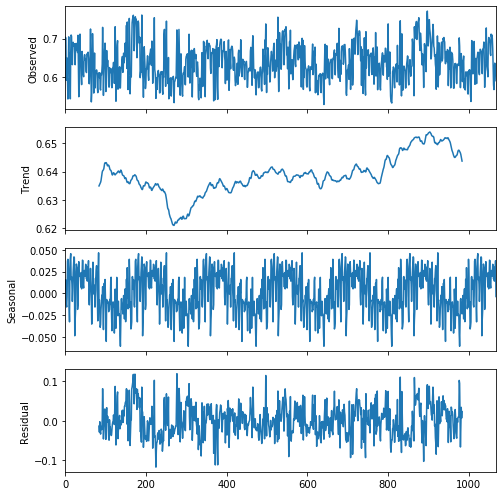

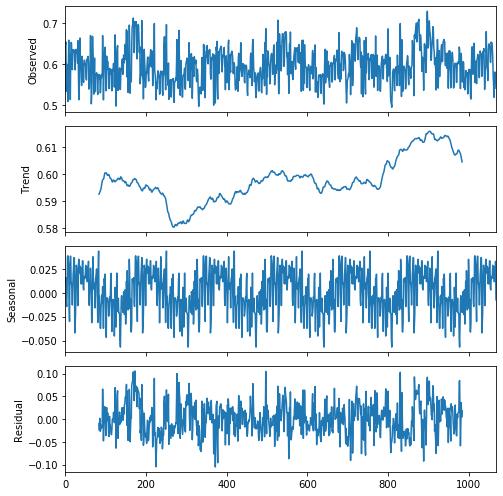

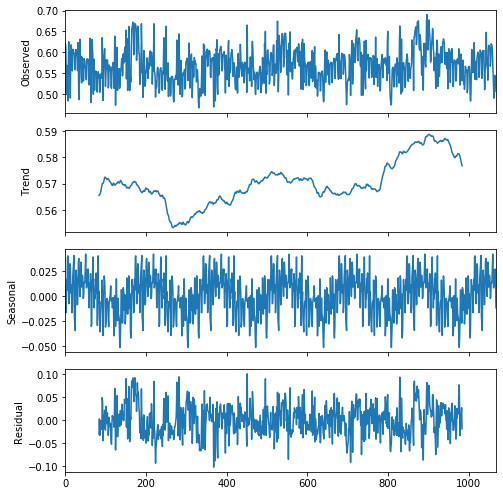

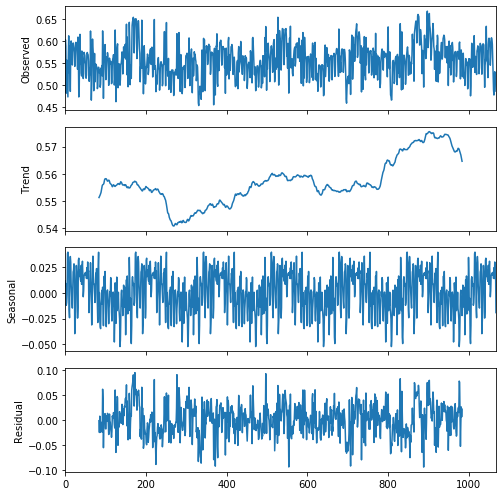

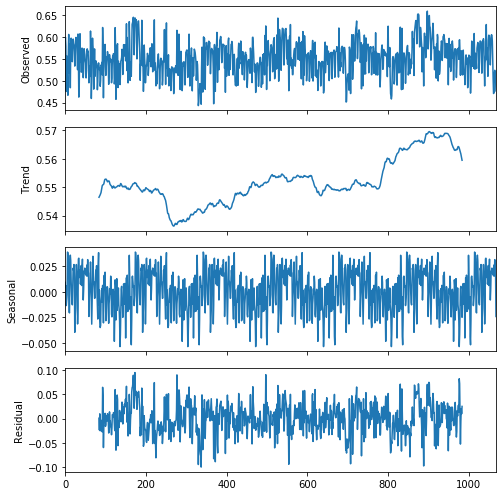

...

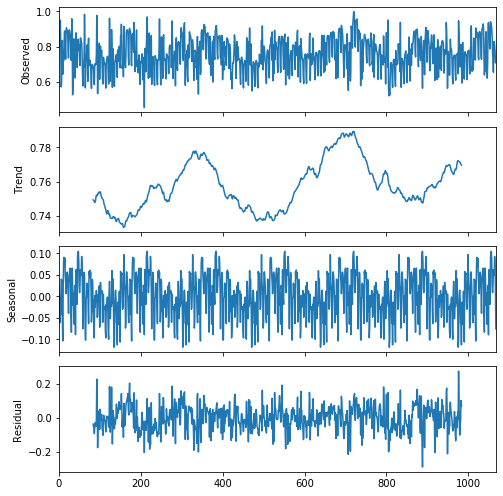

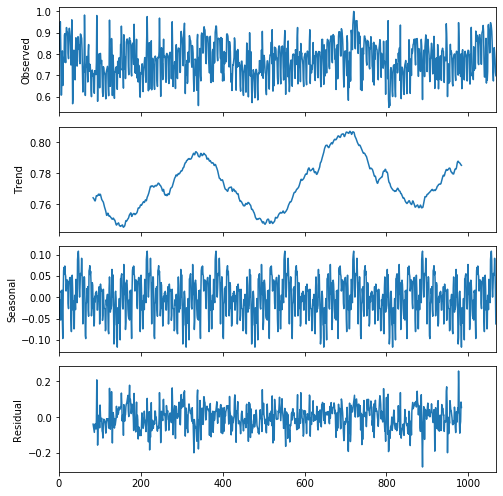

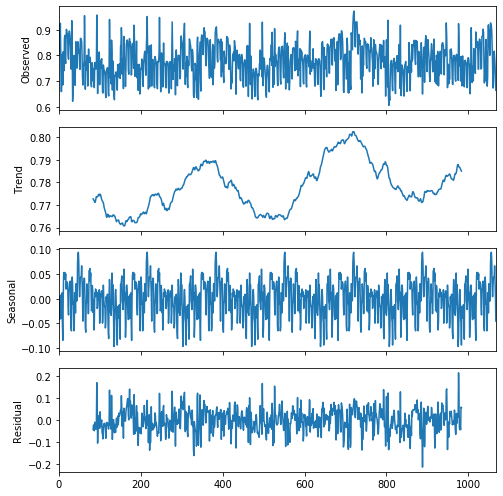

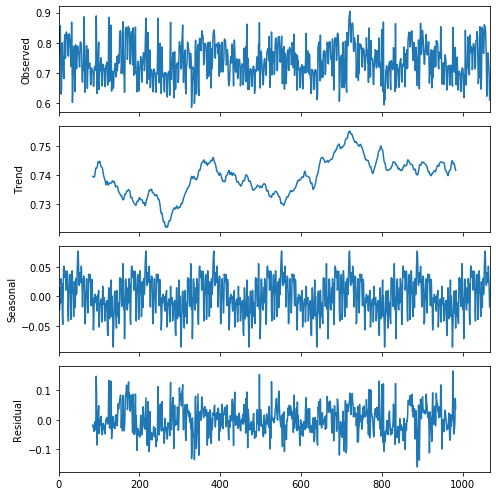

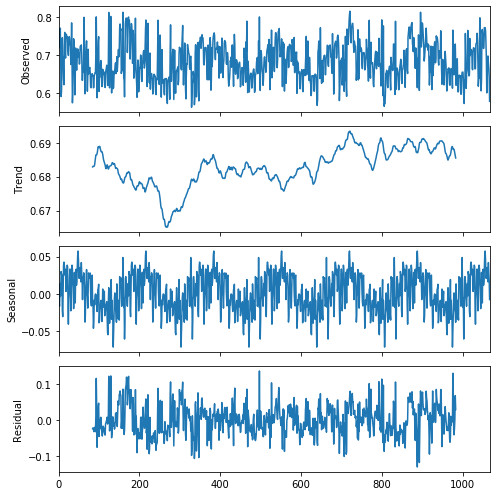

In [21]:
#plot components for every hour of the day
for result in results_add:
    plt.rcParams.update({'figure.figsize': (7,7)})
    result.plot().suptitle('', fontsize=22)
    plt.show()

In [22]:
#plot the residual series
data_frame =(pd.DataFrame(resid_list)).T
Data_resid= data_frame[2:32]
fig = px.line(Data_resid, x= Data_resid.index, y=Data_resid.columns)
fig.show()

In [10]:
#plot the trend series
data_frame_tr =(pd.DataFrame(trend_list)).T
Data_trend= data_frame_tr
fig = px.line(Data_trend, x= Data_trend.index, y=Data_trend.columns)
fig.show()

In [11]:
#plot the season series
data_frame_se =(pd.DataFrame(season_list)).T
Data_season= data_frame_se[2:32]
fig = px.line(Data_season, x= Data_season.index, y=Data_season.columns)
fig.show()

In [12]:
#plot the tre_sea_res series
data_frame_tsr =(pd.DataFrame(tre_sea_res)).T
Data_tsr= data_frame_tsr#[2:32]
fig = px.line(Data_tsr, x= Data_tsr.index, y=Data_tsr.columns)
fig.show()

In [17]:
###prepare data for clustering#####
#Data_array = np.array(season_list)
#Data_array = np.array(trend_list)
#Data_array = np.array(tre_sea_res)
###to cluster residual series
#Data_array = np.array(resid_list)
#final_hourly_data = Data_array.reshape(Data_array.shape[0], Data_array.shape[1], 1)
#################without decomposition#############
#A set of time series should be formatted as a three-dimensional array with shape (num_series, max_length, 1), (24, 1433, 1)
   
transpose_Data = Data_by_hour.T
transpose_Data_array = transpose_Data.to_numpy()
transpose_Data_array.shape
final_hourly_data = transpose_Data_array.reshape(transpose_Data_array.shape[0], transpose_Data_array.shape[1], 1)
final_hourly_data.shape


(24, 3931, 1)

In [18]:
#allpy k-means clusterig for time series using dynamic time warping (DTW) algorithm to mesure the simirarity
import tslearn
from tslearn.clustering import TimeSeriesKMeans
start_time1 = datetime.now()
model = TimeSeriesKMeans(n_clusters=3, metric="dtw", max_iter=10, random_state=7)
model.fit(final_hourly_data)
start_time2 = datetime.now()
print(start_time2-start_time1)


C:\Users\MyPc\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:143: FutureWarning:

The sklearn.cluster.k_means_ module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.cluster. Anything that cannot be imported from sklearn.cluster is now part of the private API.



0:12:02.813328


In [16]:
#Davies Bouldin Index (DBI) function
#from scipy.spatial import distance

# nc is number of clusters
def compute_s(i, x, labels, clusters):
    norm_c= len(clusters)
    s = 0
    for c in clusters:
        s += tslearn.metrics.dtw(c, clusters[i])
    return s/norm_c

def compute_Rij(i, j, x, labels, clusters, nc):
    Rij = 0.0
    try:
        # print "h"
        d = tslearn.metrics.dtw(clusters[i],clusters[j])
        # print d
        Rij = (compute_s(i, x, labels, clusters) + compute_s(j, x, labels, clusters))/d
        # print Rij
    except:
        Rij = 0
    return Rij

def compute_R(i, x, labels, clusters, nc): 
    list_r = []
    for i in range(nc):
        for j in range(nc):
            if(i!=j):
                temp = compute_Rij(i, j, x, labels, clusters, nc)
                list_r.append(temp)

    return max(list_r)

def compute_DB_index(x, labels, clusters, nc):
    # print x
    sigma_R = 0.0
    for i in range(nc):
        sigma_R = sigma_R + compute_R(i, x, labels, clusters, nc)

    DB_index = float(sigma_R)/float(nc)
    return DB_index


    

In [ ]:
centroids = model.cluster_centers_ 
index_db_val = compute_DB_index(final_hourly_data, y_pred, centroids, 3)
print ("The value of Davies Bouldin index for a K-Means cluser of size " + str(3) + " is: " + str(index_db_val))

In [ ]:
#calculate silhouette_score and Davies Bouldin Index (DBI) for k between 2-13
start_time1 = datetime.now()
Sil_scores = []
DBindex = []
for i in range(2,13):
    model = TimeSeriesKMeans(n_clusters=i, metric="dtw", max_iter=10, random_state=7)
    model.fit(final_hourly_data)
    centroids = model.cluster_centers_
    y_pred = model.predict(final_hourly_data)
    sil = tslearn.clustering.silhouette_score(final_hourly_data, y_pred, metric="dtw")  
    Sil_scores.append(sil)
    print("Silhouette " + str(i) + " is: " + str(sil))
    index_db = compute_DB_index(final_hourly_data, y_pred, centroids, i)
    DBindex.append(index_db)
    print ("Davies Bouldin index " + str(i) + " is: " + str(index_db))
start_time2 = datetime.now()
print(start_time2-start_time1)

In [ ]:
#values of silhouette and DBIndex without decomposition
silhouette =np.array([0.5720, 0.4377,0.3417, 0.3198, 0.3318, 0.3373, 0.3018, 0.3130, 0.3150, 0.2717, 0.2697, 0.2664])
DBIndex = np.array([1.0, 1.6741, 2.9084, 3.2491, 3.3781, 3.5447, 3.4313, 3.2480, 3.2168, 3.6723, 4.5916, 5.4535]) 
clusterCount = np.array([2,3,4,5,6,7,8,9,10,11,12,13])

In [ ]:
fig = px.line( x= clusterCount, y=DBIndex,title="Davies Bouldin index for k-Means Clustering")
fig.show()

In [ ]:
fig = px.line( x= clusterCount, y=silhouette,title="Silhouette score Elbow for k-Means Clustering")
fig.show()

In [19]:
#residual
y_pred = model.predict(final_hourly_data)
print(y_pred)

[1 1 1 1 1 1 1 2 2 2 0 0 0 0 0 0 0 0 0 0 0 2 2 1]


In [20]:
#create a function to find te groups of hours
def find_relative_hours(predictions, clusters):
    total_clusters = []
    for j in range(0,clusters):
        total_clusters.append([])
    for i in range(0,len(predictions)):
        for j in range(0,clusters):
            if predictions[i] == j:
                total_clusters[j].append(i)
                break
    return total_clusters
                

In [51]:
#save information without 2018
#without decomposition
#[[7, 8, 15, 16, 17, 18, 22], [0, 1, 2, 3, 4, 5, 6, 23], [9, 10, 11, 12, 13, 14, 19, 20, 21]]
#trend
#[[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22], [1, 2, 3, 4, 5, 6], [0, 7, 8, 23]]
#residual
#[[12, 13, 14, 15, 16, 17, 18, 19, 21], [0, 1, 2, 3, 4, 5, 6, 22, 23], [7, 8, 9, 10, 11, 20]]
#season
#[[12, 13, 14, 15, 16, 17, 18, 19, 20], [0, 1, 2, 3, 4, 5, 6, 21, 22, 23], [7, 8, 9, 10, 11]]
#tre_sea_res
#[[12, 13, 14, 15, 16, 17, 18, 22, 23], [0, 1, 2, 3, 4, 5], [6, 7, 8, 9, 10, 11, 19, 20, 21]]

#iso new england 
#without decomposition
#[[11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21], [1, 2, 3, 4, 5, 6,7, 24], [ 8, 9,10, 22, 23]]
#[1 1 1 1 1 1 1 2 2 2 0 0 0 0 0 0 0 0 0 0 0 2 2 1]


In [21]:
#find the clusters, for n clusters find_relative_hours(y_pred, n)
#total_clusters =[[12, 13, 14, 15, 16, 17, 18, 21], [0, 1, 2, 3, 4, 5, 6, 22, 23], [7, 8, 9, 10, 11, 19, 20]]
total_clusters = find_relative_hours(y_pred, 3)
print(total_clusters)

[[10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20], [0, 1, 2, 3, 4, 5, 6, 23], [7, 8, 9, 21, 22]]


In [32]:
total_clusters = [[7, 8, 15, 16, 17, 18, 22], [0, 1, 2, 3, 4, 5, 6, 23], [9, 10, 11, 12, 13, 14, 19, 20, 21]]


In [172]:
#create n different dataframes , one of any cluster, to feed n different lstms

def Dataframe_maker(Dataframe, total_clusters):
    import copy
    hours = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23]
    total_dataframes = []

    for cluster in total_clusters:
        for item in cluster:
            float(item)
        Dataframe['time'] = list(Dataframe.index)
        Dataframe_copy = pd.DataFrame(columns = Dataframe.columns, data = copy.deepcopy(Dataframe.values))
        Dataframe_hour = Dataframe_copy.set_index('hour')
        #find the hours not exist in cluster
        not_in_cluster = list(list(set(cluster)-set(hours)) + list(set(hours)-set(cluster)))
        total_dataframes.append(Dataframe_hour.drop(not_in_cluster))
        
        
    return total_dataframes

In [173]:
total_dataframes = Dataframe_maker(Final_Data, total_clusters)

# compute complexity and predictability


In [174]:
#compute complexity and predictability of 3 new time series
#C E(T ) is a complexity estimate of a time series T
#time_series mst be an array
def complexity_estimator(time_series):
    sum_series = 0
    for i in range(0,len(time_series)-1):
        term = (time_series[i]- time_series[i+1])**2
        sum_series += term
    ce = sqrt(sum_series)  
    return ce

#MEAN ABSOLUTE CHANGE (MAC)
def mean_absolute_change(time_series):
    sum_series = 0
    for i in range(0,len(time_series)-1):
        term = abs(time_series[i+1]- time_series[i])
        sum_series += term
    mac = sum_series/len(time_series)
    return mac

In [175]:
from sklearn.neighbors import KDTree

def _app_samp_entropy(x, order, metric='chebyshev', approximate=True):
    """Utility function for `app_entropy`` and `sample_entropy`.
    """
    _all_metrics = KDTree.valid_metrics
    if metric not in _all_metrics:
        raise ValueError('The given metric (%s) is not valid. The valid '
                         'metric names are: %s' % (metric, _all_metrics))
    phi = np.zeros(2)
    r = 0.2 * np.std(x, ddof=0)

    # compute phi(order, r)
    _emb_data1 = _embed(x, order, 1)
    if approximate:
        emb_data1 = _emb_data1
    else:
        emb_data1 = _emb_data1[:-1]
    count1 = KDTree(emb_data1, metric=metric).query_radius(emb_data1, r,
                                                           count_only=True
                                                           ).astype(np.float64)
    # compute phi(order + 1, r)
    emb_data2 = _embed(x, order + 1, 1)
    count2 = KDTree(emb_data2, metric=metric).query_radius(emb_data2, r,
                                                           count_only=True
                                                           ).astype(np.float64)
    if approximate:
        phi[0] = np.mean(np.log(count1 / emb_data1.shape[0]))
        phi[1] = np.mean(np.log(count2 / emb_data2.shape[0]))
    else:
        phi[0] = np.mean((count1 - 1) / (emb_data1.shape[0] - 1))
        phi[1] = np.mean((count2 - 1) / (emb_data2.shape[0] - 1))
    return phi

def app_entropy(x, order=2, metric='chebyshev'):
    """Approximate Entropy.
    Parameters
    ----------
    x : list or np.array
        One-dimensional time series of shape (n_times).
    order : int
        Embedding dimension. Default is 2.
    metric : str
        Name of the distance metric function used with
        :py:class:`sklearn.neighbors.KDTree`. Default is to use the
        `Chebyshev <https://en.wikipedia.org/wiki/Chebyshev_distance>`_
        distance.
    Returns
    -------
    ae : float
        Approximate Entropy.
    Notes
    -----
    Approximate entropy is a technique used to quantify the amount of
    regularity and the unpredictability of fluctuations over time-series data.
    Smaller values indicates that the data is more regular and predictable.
    The tolerance value (:math:`r`) is set to :math:`0.2 * \\text{std}(x)`.
    Code adapted from the `mne-features <https://mne.tools/mne-features/>`_
    package by Jean-Baptiste Schiratti and Alexandre Gramfort.
    References
    ----------
    Richman, J. S. et al. (2000). Physiological time-series analysis
    using approximate entropy and sample entropy. American Journal of
    Physiology-Heart and Circulatory Physiology, 278(6), H2039-H2049.
    https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.DistanceMetric.html
    Examples
    --------
    >>> from entropy import app_entropy
    >>> import numpy as np
    >>> np.random.seed(1234567)
    >>> x = np.random.rand(3000)
    >>> print(app_entropy(x, order=2))
    2.076046899582793
=    """
    phi = _app_samp_entropy(x, order=order, metric=metric, approximate=True)
    return np.subtract(phi[0], phi[1])


def _embed(x, order=3, delay=1):
    """Time-delay embedding.
    Parameters
    ----------
    x : 1d-array
        Time series, of shape (n_times)
    order : int
        Embedding dimension (order).
    delay : int
        Delay.
    Returns
    -------
    embedded : ndarray
        Embedded time-series, of shape (n_times - (order - 1) * delay, order)
    """
    N = len(x)
    if order * delay > N:
        raise ValueError("Error: order * delay should be lower than x.size")
    if delay < 1:
        raise ValueError("Delay has to be at least 1.")
    if order < 2:
        raise ValueError("Order has to be at least 2.")
    Y = np.zeros((order, N - (order - 1) * delay))
    for i in range(order):
        Y[i] = x[i * delay:i * delay + Y.shape[1]]
    return Y.T

In [176]:
#calculate MAC for load time series which created by n-th cluster 
time_series = np.array(total_dataframes[2]["total load actual"])
mac = mean_absolute_change(time_series)
print("MAC: ",mac)
#calculate CE for load time series which created by n cluster
ce = complexity_estimator(time_series)
print("CE: ", ce)
#calculate app_entropy for load time series which created by n cluster
ap_en = app_entropy(time_series, order=2, metric='chebyshev')
print("ap_en", ap_en)

MAC:  0.02633134280065315
CE:  4.163405899149169
ap_en 1.1308737414048813


In [236]:
#for each hourly time series
MAC_hourly = []
CE_hourly = []
App_Entropy_hourly = []
for i in range(0, 24):
    time_series = np.array(Data_by_hour[str(i)+ " hour"])
    mac = mean_absolute_change(time_series)
    ce = complexity_estimator(time_series)
    App_En = app_entropy(time_series, order=2, metric='chebyshev')
    MAC_hourly.append(mac)
    CE_hourly.append(ce)
    App_Entropy_hourly.append(App_En)

clusters = [[9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22], [1, 2, 3, 4, 5, 6], [0, 7, 8, 23]]

count = 0
MAC_cluster = [[], [], []]
CE_cluster = [[], [], []]
App_Entropy_cluster = [[], [], []]
for cluster in clusters:  
    for i in cluster:
        MAC_cluster[count].append(float("{:.4f}".format(MAC_hourly[i])))
        CE_cluster[count].append(float("{:.4f}".format(CE_hourly[i])))
        App_Entropy_cluster[count].append(float("{:.4f}".format(App_Entropy_hourly[i])))
    print("Cluster" + str(count+1)+'\n',"MAC", MAC_cluster[count], '\n', "CE", CE_cluster[count])
    print( "App_Entropy", App_Entropy_cluster[count],'\n')
    count += 1


Cluster1
 MAC [0.0894, 0.081, 0.0769, 0.0776, 0.0747, 0.0676, 0.072, 0.0767, 0.0789, 0.0756, 0.0714, 0.0625, 0.0521, 0.0406] 
 CE [4.5857, 4.1317, 3.9041, 3.9423, 3.7922, 3.4475, 3.6727, 3.9041, 4.0071, 3.8474, 3.6821, 3.2399, 2.689, 2.1453]
App_Entropy [1.3808, 1.4365, 1.4873, 1.4975, 1.4887, 1.5269, 1.5036, 1.4653, 1.4577, 1.4859, 1.4492, 1.4533, 1.4983, 1.5013] 

Cluster2
 MAC [0.0298, 0.0286, 0.029, 0.0299, 0.0334, 0.0495] 
 CE [1.5556, 1.488, 1.4784, 1.4963, 1.6332, 2.4596]
App_Entropy [1.5233, 1.5314, 1.505, 1.5148, 1.5456, 1.4442] 

Cluster3
 MAC [0.0326, 0.0779, 0.0929, 0.0332] 
 CE [1.6991, 4.0055, 4.8057, 1.7773]
App_Entropy [1.5222, 1.3694, 1.3472, 1.4901] 

